In [2]:
execfile('importibuttondata.py')

/Users/ascott47/anaconda/lib/python2.7/site-packages/matplotlib/__init__.py:892: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))
/Users/ascott47/anaconda/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [3]:
# Import any observation data
date_spec = {'Date': [ 2]}
observations = pd.read_csv('data/sciencecenterobservations.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations.TMAX = observations.TMAX/10. 
observations.index = observations.index + pd.DateOffset(hours = 16)

observations2 = pd.read_csv('data/sciencecenterobservations.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations2.index = observations2.index + pd.DateOffset(hours = 6)
observations2.TMIN = observations2.TMIN/10. 

urban = observations.TMAX.combine_first(observations2.TMIN)

observations = pd.read_csv('data/bwiobservations.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations.TMAX = observations.TMAX/10. 
observations.index = observations.index + pd.DateOffset(hours = 16)

observations2 = pd.read_csv('data/bwiobservations.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations2.index = observations2.index + pd.DateOffset(hours = 6)
observations2.TMIN = observations2.TMIN/10. 

rural = observations.TMAX.combine_first(observations2.TMIN)
observations = pd.DataFrame(data = [urban, rural], index = ['urban', 'rural']).T
#observations.rename(columns = ('u', 'r'))
#observations.rural

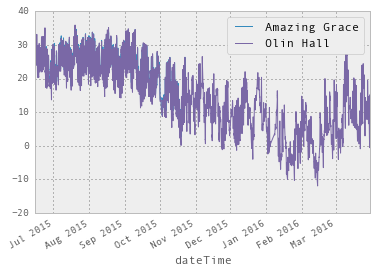

In [4]:
# import davis weather station data from database
import sqlite3
conn = sqlite3.connect('amazinggrace-weewx.sdb')
amazinggracedf = pd.read_sql_query('SELECT * from archive', conn)
amazinggracedf['dateTime']=pd.to_datetime(amazinggracedf['dateTime'], unit='s')
amazinggracedf.outTemp = (amazinggracedf.outTemp-32)*5./9.
amazinggracedf = amazinggracedf.set_index('dateTime')

conn = sqlite3.connect('olinhall-weewx.sdb')
olinhalldf = pd.read_sql_query('SELECT * from archive', conn)
olinhalldf['dateTime']=pd.to_datetime(olinhalldf['dateTime'], unit='s')
olinhalldf.outTemp = (olinhalldf.outTemp-32)*5./9.
olinhalldf = olinhalldf.set_index('dateTime')

amazinggracedf.outTemp.plot(label = 'Amazing Grace')
plt.hold(True)
olinhalldf.outTemp.plot(label = 'Olin Hall')
plt.legend()

In [5]:
# Import a longer date range
date_spec = {'Date': [ 2]}
observations= pd.read_csv('data/582796.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations.TMAX = observations.TMAX/10. 
observations.index = observations.index + pd.DateOffset(hours = 16)

observations2= pd.read_csv('data/582796.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations2.index = observations2.index + pd.DateOffset(hours = 6)
observations2.TMIN = observations2.TMIN/10. 
# urban = observations.TMAX.combine_first(observations2.TMIN)
# rural = observations.TMAX.combine_first(observations2.TMIN)

urban = observations[observations.STATION=='GHCND:USW00093784'].TMAX.combine_first(observations2[observations2.STATION=='GHCND:USW00093784'].TMIN)
rural = observations[observations.STATION=='GHCND:USW00093721'].TMAX.combine_first(observations2[observations2.STATION=='GHCND:USW00093721'].TMIN)
observations = pd.DataFrame(data = [urban, rural], index = ['urban', 'rural']).T
observations = observations[observations.urban.values > -100]
observations = observations[observations.rural.values > -100]

observations2 = observations

In [5]:
observations= pd.read_csv('582796.csv', sep = ',', parse_dates = date_spec, keep_date_col=True, index_col=0)
observations.columns

Index([u'STATION', u'STATION_NAME', u'DATE', u'MDPR', u'PRCP', u'SNWD',
       u'SNOW', u'TSUN', u'TMAX', u'TMIN'],
      dtype='object')

In [140]:
#june = observations[observations.index.month==6]
#july = observations[observations.index.month==7]
#august = observations[observations.index.month==8]
#observations = june.combine_first(july.combine_first(august))
#observations = observations[observations.index.hour == 6]

In [4]:
def scatterfit(x,y,title, xname, yname, filename): #scatter x against y and add a 1:1 line along with a best linear fit
    fig  = plt.figure(figsize=(30, 12))
    index = np.isfinite(x) & np.isfinite(y) # Find where the observations aren't NaNs
    m,b = np.polyfit(x[index],y[index],1)

    plt.plot(x , m*(x)+b, 
             color = pd.tools.plotting._get_standard_colors(3)[0],
             lw =4,
             label = '$T_R=%.2f \cdot T_U+%.2f$'%(m,b),
             )
    plt.scatter(x,y,  
                label ='NOAA stations', 
                s = 100,
                color = pd.tools.plotting._get_standard_colors(3)[1],
                ) #lw = .75, edgecolor = 'gray')
    
    plt.plot(x,x, 'k', 
             label = '1:1 correspondance', 
             color = pd.tools.plotting._get_standard_colors(3)[2], 
             lw = 4)
    plt.xlabel(xname)
    plt.ylabel(yname)
    plt.xlim([-20,50])
    plt.ylim([-20,50])
    plt.legend(loc = 4) #bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)#, ncol = 3)
    plt.title(title)
    #plt.title('Urban vs. Rural temperature, %s to %s'%(observations.index[0], observations.index[-1]))
    matplotlib.rcParams.update({'font.size': 22})
    plt.savefig(filename, format = 'eps', dpi = 600, 
                )
    plt.show()

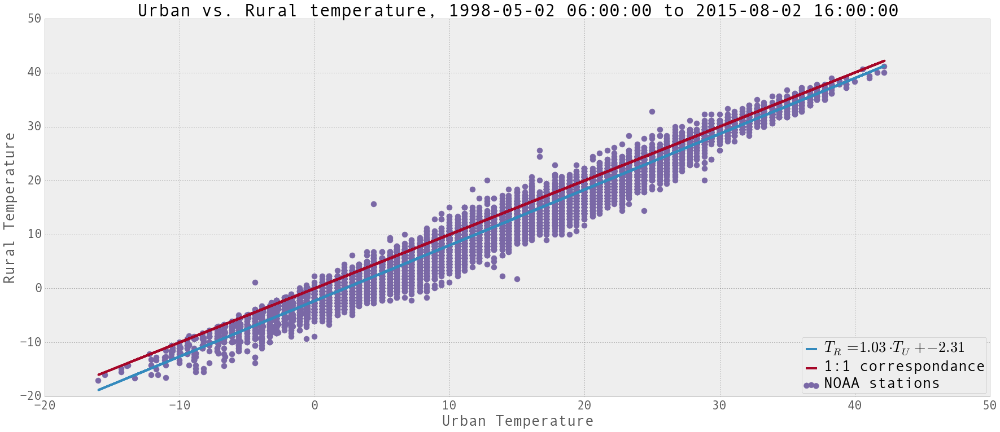

In [5]:
#plot urban versus rural temp
filename = 'uvsrural.eps'
title = 'Urban vs. Rural temperature, %s to %s'%(observations.index[0], observations.index[-1])
scatterfit(observations.urban.values, observations.rural.values, title,
           'Urban Temperature', 'Rural Temperature', 
           filename)

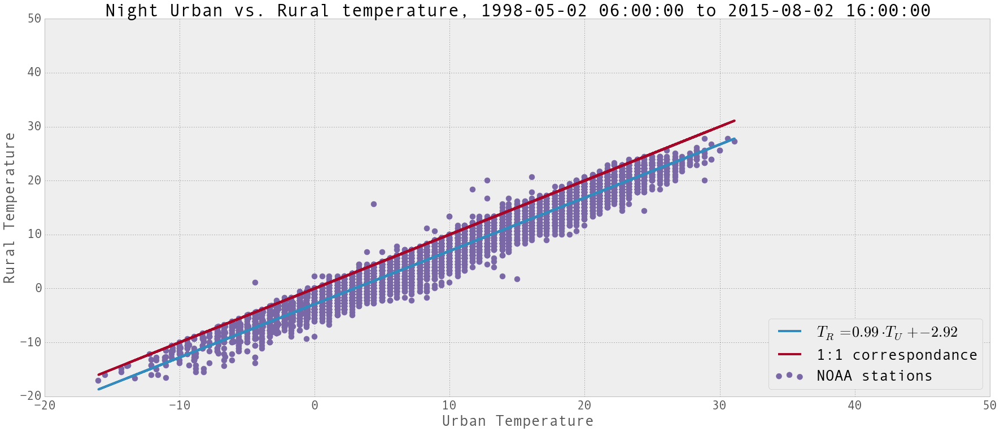

In [6]:
# plot night u vs. r
hour = 6
filename = 'uvsruralnight.eps'
title = 'Night Urban vs. Rural temperature, %s to %s'%(observations.index[0], observations.index[-1])
scatterfit(observations[observations.index.hour==hour].urban.values, 
           observations[observations.index.hour==hour].rural.values, title,
           'Urban Temperature', 'Rural Temperature', 
           filename)

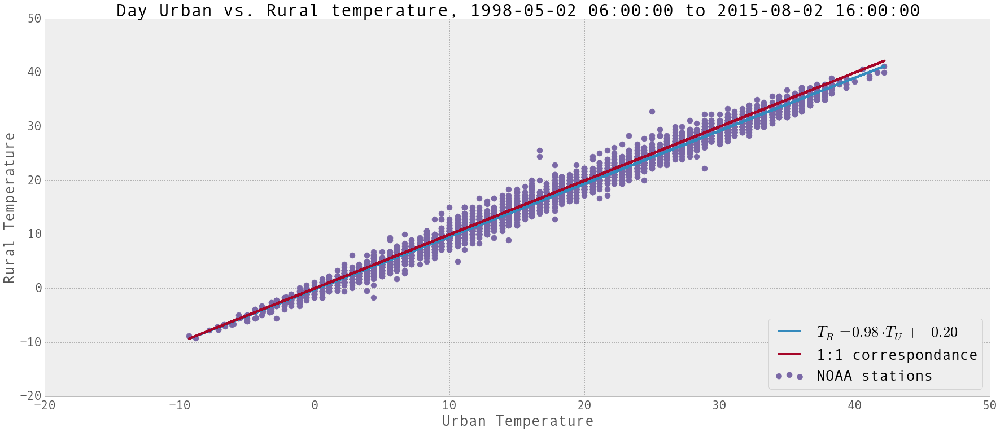

In [7]:
# plot night u vs. r
hour = 16
filename = 'uvsruralday.eps'
title = 'Day Urban vs. Rural temperature, %s to %s'%(observations.index[0], observations.index[-1])
scatterfit(observations[observations.index.hour==hour].urban.values, 
           observations[observations.index.hour==hour].rural.values, title,
           'Urban Temperature', 'Rural Temperature', 
           filename)

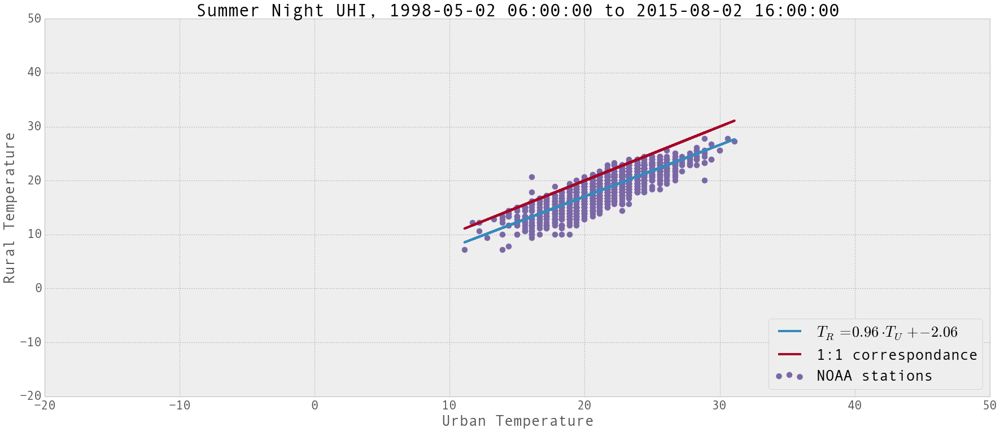

In [8]:
#summernight uhi 
hour = 6
june = observations[observations.index.month == 6]
july = observations[observations.index.month == 7]
august = observations[observations.index.month == 8]
observations1 = june.combine_first(july.combine_first(august))

title = 'Summer Night UHI, %s to %s'%(observations.index[0], observations.index[-1])
filename = 'uvsruralsummernight.eps'
scatterfit(observations1[observations1.index.hour==hour].urban.values, 
           observations1[observations1.index.hour==hour].rural.values, title,
           'Urban Temperature', 'Rural Temperature', filename)

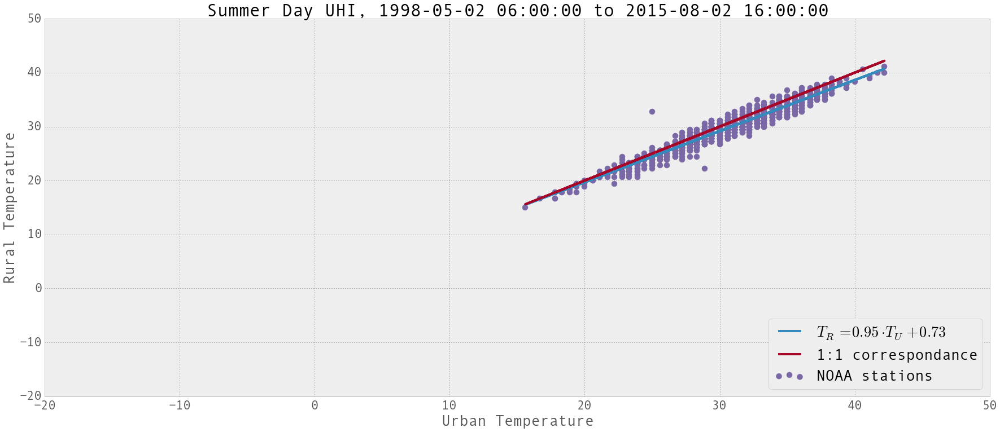

In [9]:
#summer day uhi 
hour = 16
june = observations[observations.index.month == 6]
july = observations[observations.index.month == 7]
august = observations[observations.index.month == 8]
observations1 = june.combine_first(july.combine_first(august))
filename = 'uvsruralsummerday.eps'
title = 'Summer Day UHI, %s to %s'%(observations.index[0], observations.index[-1])

scatterfit(observations1[observations1.index.hour==hour].urban.values, 
           observations1[observations1.index.hour==hour].rural.values, title,'Urban Temperature', 'Rural Temperature', 
           filename)

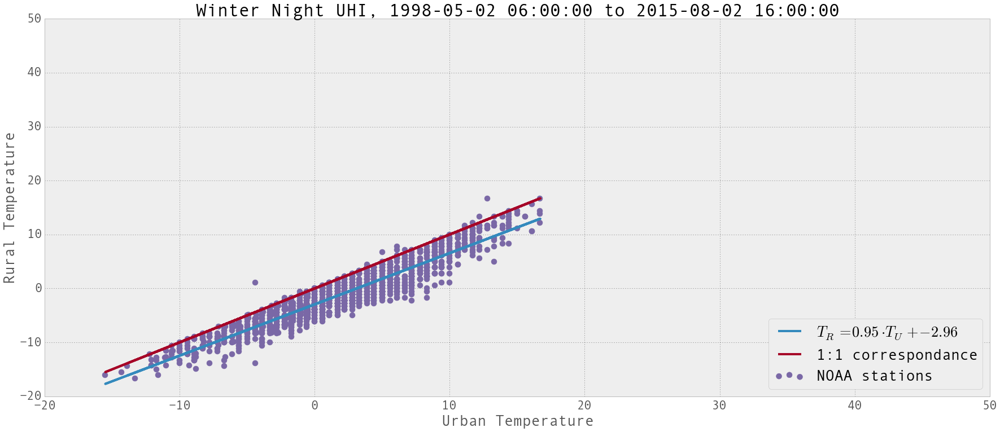

In [11]:
#winter night uhi 
hour = 6
june = observations[observations.index.month == 11]
july = observations[observations.index.month == 12]
august = observations[observations.index.month == 1]
observations1 = june.combine_first(july.combine_first(august))

title = 'Winter Night UHI, %s to %s'%(observations.index[0], observations.index[-1])
filename = 'uvsruralwinternight.eps'
scatterfit(observations1[observations1.index.hour==hour].urban.values, 
           observations1[observations1.index.hour==hour].rural.values, title,'Urban Temperature', 'Rural Temperature',
           filename)

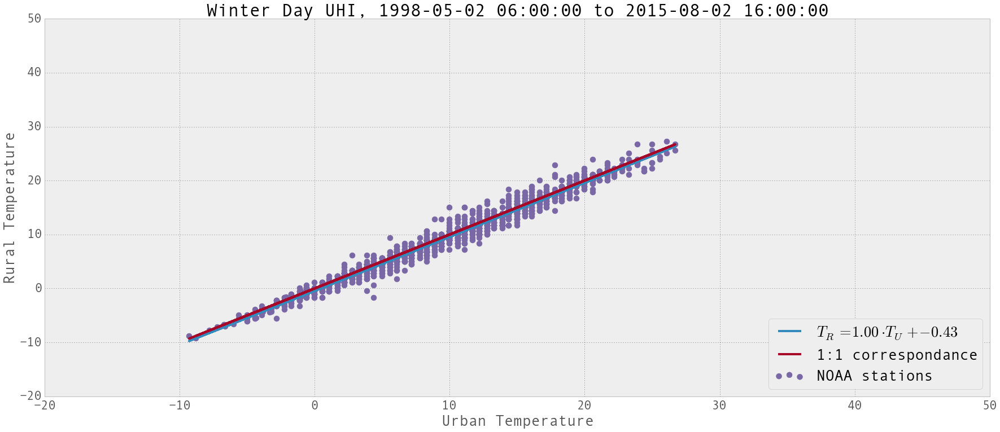

In [13]:
#winter day uhi 
hour = 16
june = observations[observations.index.month == 11]
july = observations[observations.index.month == 12]
august = observations[observations.index.month == 1]
observations1 = june.combine_first(july.combine_first(august))

title = 'Winter Day UHI, %s to %s'%(observations.index[0], observations.index[-1])
filename = 'uvsruralwinterday.eps'
scatterfit(observations1[observations1.index.hour==hour].urban.values, 
           observations1[observations1.index.hour==hour].rural.values, title,'Urban Temperature', 'Rural Temperature',
           filename)

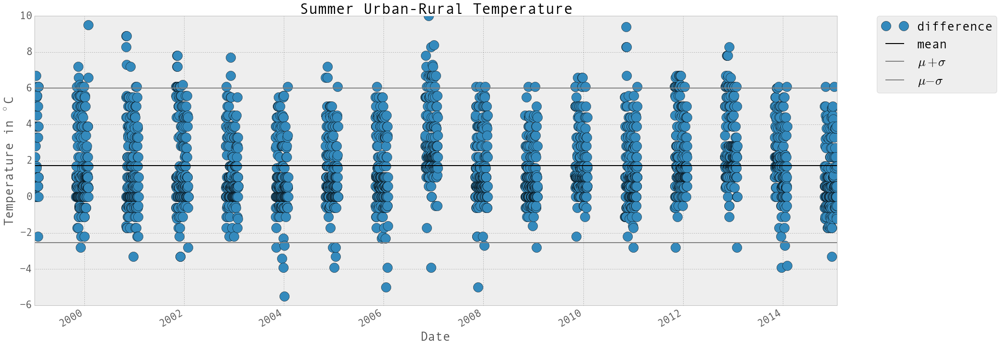

In [14]:
fig  = plt.figure(figsize=(30, 12))
(observations1.urban- observations1.rural).plot(style = 'o', label = 'difference', linewidth = 3, markersize = 20)
plt.axhline((observations1.urban- observations1.rural).mean(), label = 'mean', color = 'black', lw = 2)
plt.axhline((observations1.urban- observations1.rural).var()+(observations1.urban- observations1.rural).mean(),
            label = '$\mu + \sigma$', lw = 2, color = 'gray')
plt.axhline(-1*(observations1.urban- observations1.rural).var()+(observations1.urban- observations1.rural).mean(), 
            label = '$\mu - \sigma$', lw = 2, color = 'gray')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Summer Urban-Rural Temperature')
plt.ylabel('Temperature in $^\circ $C')
filename = 'uhitimeseriessummer.eps'
plt.savefig(filename, format = 'eps', dpi = 600, )

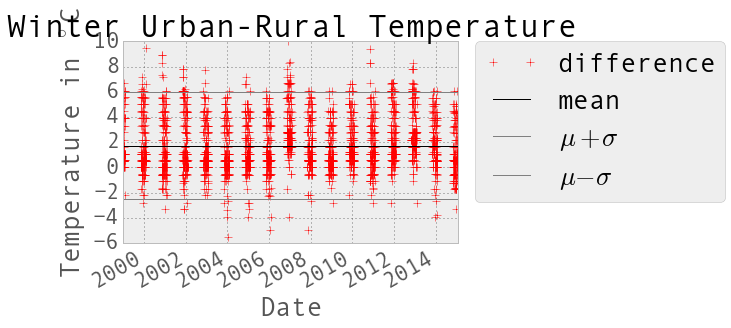

In [15]:
(observations1.urban- observations1.rural).plot(style = '+r', label = 'difference', linewidth = 3, markersize = 8)
plt.axhline((observations1.urban- observations1.rural).mean(), label = 'mean', color = 'black')
plt.axhline((observations1.urban- observations1.rural).var()+(observations1.urban- observations1.rural).mean(), label = '$\mu + \sigma$', color = 'gray')
plt.axhline(-1*(observations1.urban- observations1.rural).var()+(observations1.urban- observations1.rural).mean(), label = '$\mu - \sigma$', color = 'gray')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Winter Urban-Rural Temperature')
plt.ylabel('Temperature in $^\circ $C')
filename = 'uhitimeseriessummer.eps'
plt.savefig(filename, format = 'eps', dpi = 600, )

Difference is:  1.97289048474


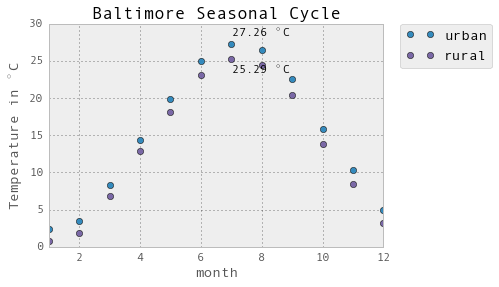

In [21]:
fig  = plt.figure(figsize=(20,20))
yearly =  observations
yearly["month"] = observations.index.month
yearly.set_index("month")
ax = yearly.groupby("month").mean().plot(style = 'o')

plt.text(yearly.groupby("month").mean().rural.argmax(), 
         yearly.groupby("month").mean().rural.max()-2, 
         '%.2f $^\circ$C' %yearly.groupby("month").mean().rural.max())

plt.text(yearly.groupby("month").mean().urban.argmax(), 
         yearly.groupby("month").mean().urban.max()+1, 
         '%.2f $^\circ$C' %yearly.groupby("month").mean().urban.max())
plt.title('Baltimore Seasonal Cycle')
plt.ylabel('Temperature in $^\circ $C')
lgd = plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)#, ncol = 3)

print 'Difference is: ', yearly.groupby("month").mean().urban.max()-yearly.groupby("month").mean().rural.max()

filename = 'seasonalUHI.eps'
matplotlib.rcParams.update({'font.size': 12})
plt.savefig(filename, format = 'eps', dpi = 600, 
                    bbox_extra_artists=(lgd,), bbox_inches='tight')


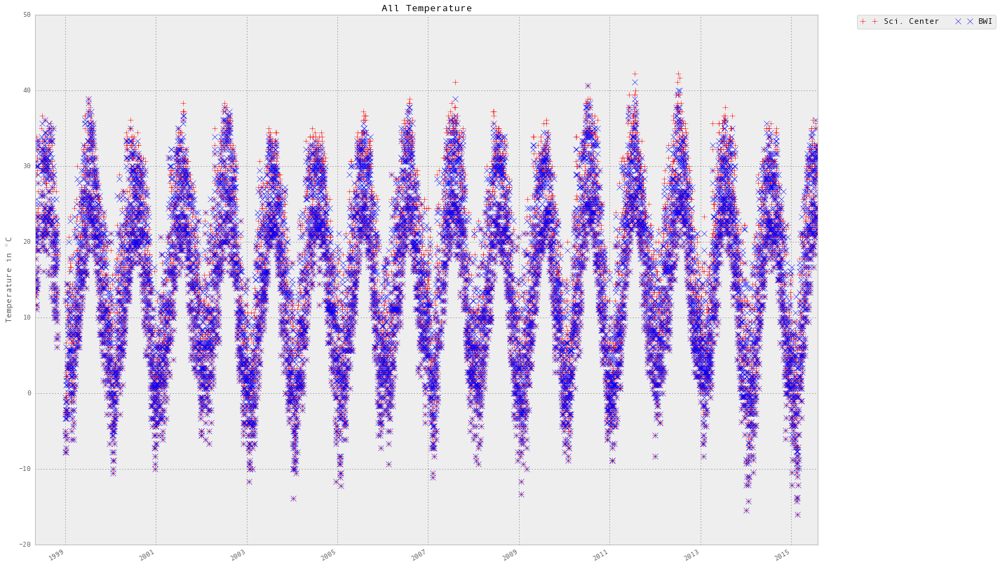

In [142]:
fig  = plt.figure(figsize=(20, 15))
observations.urban.plot(style = '+r', label = 'Sci. Center', linewidth = 3, markersize = 8)
observations.rural.plot(style = 'xb', label = 'BWI', linewidth = 3, markersize = 8)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol = 3)
plt.title('All Temperature')
plt.ylabel('Temperature in $^\circ $C')

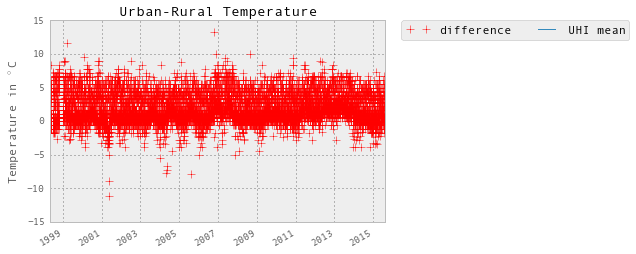

In [284]:
(observations.urban- observations.rural).plot(style = '+r', label = 'difference', linewidth = 3, markersize = 8)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol = 3)
plt.title('Urban-Rural Temperature')
plt.ylabel('Temperature in $^\circ $C')

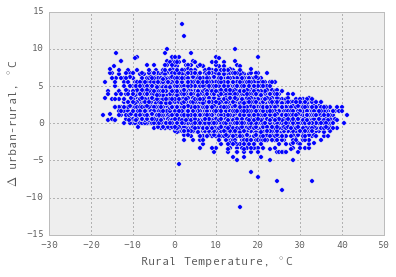

In [287]:
# does UHI grow with increasing T?
plt.scatter(observations.rural,(observations.urban- observations.rural))
plt.xlabel('Rural Temperature, $^\circ$C')
plt.ylabel('$\Delta$ urban-rural, $^\circ$C')

In [10]:
np.corrcoef(observations1.rural, (observations1.urban- observations1.rural))[0,1]

-0.51255230075124913

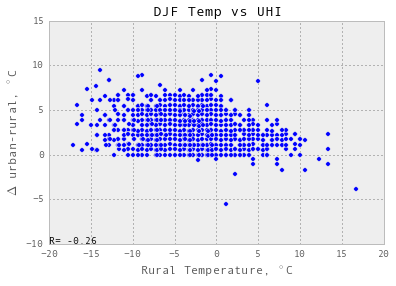

In [25]:
# does UHI grow with increasing T? for DJF
june = observations[observations.index.month == 12]
july = observations[observations.index.month == 1]
august = observations[observations.index.month == 2]
observations1 = june.combine_first(july.combine_first(august))
observations1 = observations1[observations1.index.hour==6]

plt.scatter(observations1.rural,(observations1.urban- observations1.rural))
plt.annotate('R= %2.2f'%np.corrcoef(observations1.rural, (observations1.urban- observations1.rural))[0,1] ,
             xy = (0,0), xycoords = 'axes fraction')
plt.xlabel('Rural Temperature, $^\circ$C')
plt.ylabel('$\Delta$ urban-rural, $^\circ$C')
plt.title('DJF Temp vs UHI')

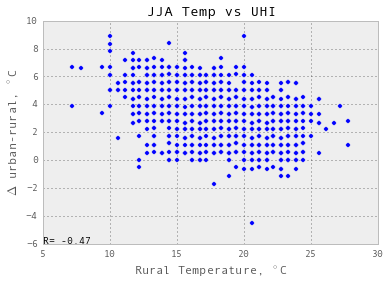

In [24]:
# does UHI grow with increasing T? for JJA
june = observations[observations.index.month == 6]
july = observations[observations.index.month == 7]
august = observations[observations.index.month == 8]
observations1 = june.combine_first(july.combine_first(august))
observations1 = observations1[observations1.index.hour==6]

plt.scatter(observations1.rural,(observations1.urban- observations1.rural))
plt.annotate('R= %2.2f'%np.corrcoef(observations1.rural, (observations1.urban- observations1.rural))[0,1] ,
             xy = (0,0), xycoords = 'axes fraction')
plt.xlabel('Rural Temperature, $^\circ$C')
plt.ylabel('$\Delta$ urban-rural, $^\circ$C')
plt.title('JJA Temp vs UHI')

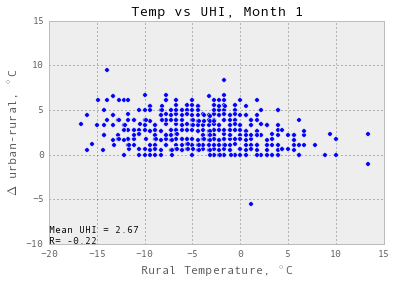

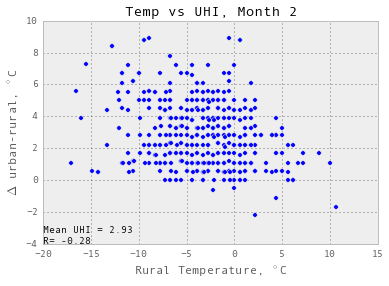

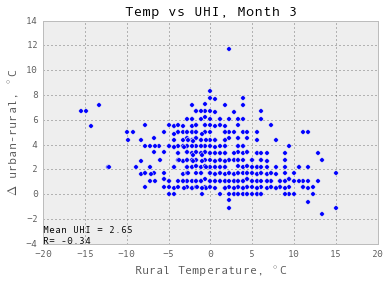

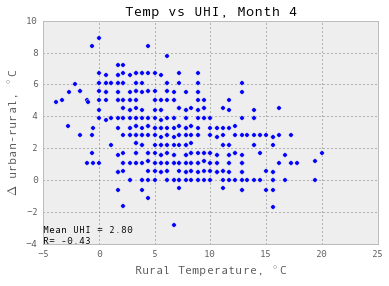

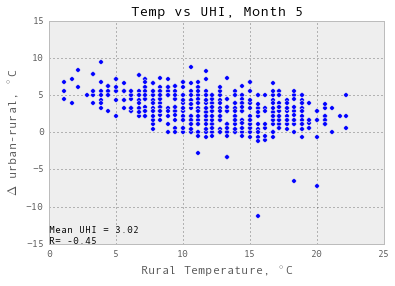

...

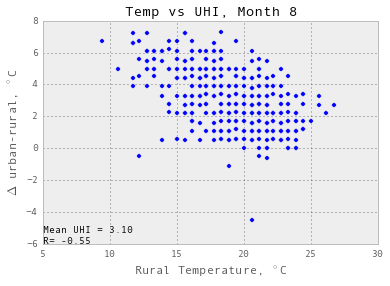

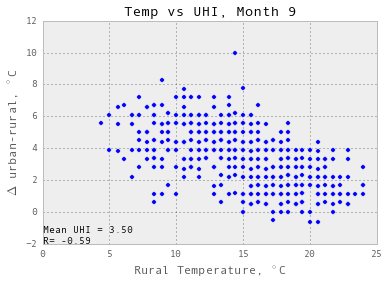

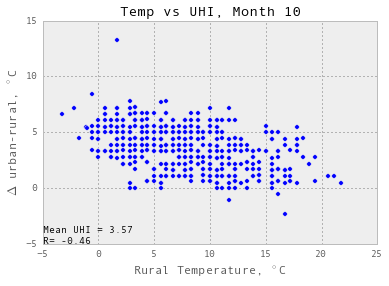

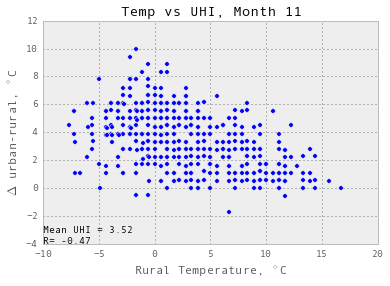

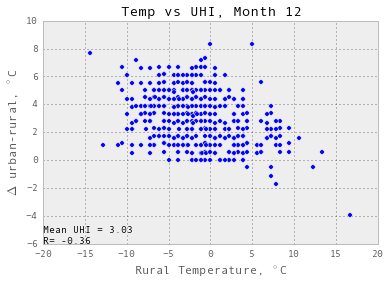

In [29]:
# does UHI grow with increasing T? for each month

for i in range(1,13): 
    plt.figure()
    observations1 = observations[observations.index.month == i]
    observations1 = observations1[observations1.index.hour==6]
    plt.scatter(observations1.rural,(observations1.urban- observations1.rural))
    plt.annotate('R= %2.2f'%np.corrcoef(observations1.rural, (observations1.urban- observations1.rural))[0,1] ,
             xy = (0,0), xycoords = 'axes fraction')
    plt.annotate('Mean UHI = %2.2f'%(observations1.urban- observations1.rural).mean(),
                xy = (0,0.05), xycoords = 'axes fraction')
    plt.xlabel('Rural Temperature, $^\circ$C')
    plt.ylabel('$\Delta$ urban-rural, $^\circ$C')
    plt.title('Temp vs UHI, Month %s'%i)

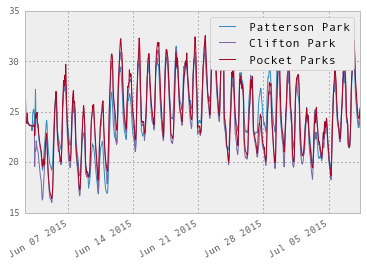

In [13]:
pattsensors = [9,11, 52, 30, 40, 65,119, 14] # missing: 6
cliftonsensors = [74, 37, 115] # missing 39, 83
greensensors = meta['sensornumber'].values[np.where(meta['landcoverclass']=='grass')]
pocketparks = np.setdiff1d(np.setdiff1d(greensensors, pattsensors), cliftonsensors) # find all the sensors in 'green' space not in big parks
# note that sensor 125, Bocek park, isn't a pocket park
tempDF[pattsensors].mean(axis=1).plot(label = 'Patterson Park')
tempDF[cliftonsensors].mean(axis=1).plot(label = 'Clifton Park')
tempDF[pocketparks].mean(axis=1).plot(label = 'Pocket Parks')
plt.legend()

In [26]:
# function draws plots of diurnal data given a pandas dataframe that has an 'hour' column added to it 
# with optional 2nd category to sort by 
pattsensors = [9,11, 52, 30, 40, 119, 65, 14] # offset: 40, missing: 6
cliftonsensors = [74, 37, 115] # missing 39, 83
greensensors = meta['sensornumber'].values[np.where(meta['landcoverclass']=='grass')]
#pocketparks = np.setdiff1d(np.setdiff1d(greensensors, pattsensors), cliftonsensors) # find all the sensors in 'green' space not in big parks
# note that sensor 125, Bocek park, isn't a pocket park
pocketparks = [12,  73]

parks = {'Patterson': pattsensors, 'Clifton': cliftonsensors, 'Parks': pocketparks}
parks.keys()

AttributeError: 'list' object has no attribute 'len'

In [41]:
# function draws plots of diurnal data given a pandas dataframe that has an 'hour' column added to it 
# with optional 2nd category to sort by 
pattsensors = [9,11, 52, 30, 40, 119, 65, 14] # offset: 40, missing: 6
cliftonsensors = [74, 37, 115] # missing 39, 83
greensensors = meta['sensornumber'].values[np.where(meta['landcoverclass']=='grass')]
#pocketparks = np.setdiff1d(np.setdiff1d(greensensors, pattsensors), cliftonsensors) # find all the sensors in 'green' space not in big parks
# note that sensor 125, Bocek park, isn't a pocket park
pocketparks = [12,  73]

parks = {'Patterson': pattsensors, 'Clifton': cliftonsensors, 'Parks': pocketparks}

def diurnalplotsgeneral(diurnalDF, parks):

        fig  = plt.figure(figsize=(30, 12))
        plt.subplot(1,2,2)
        
        m = Basemap(llcrnrlon=meta['location:Longitude'].min()-.005,
            llcrnrlat=meta['location:Latitude'].min()-.0005,
            urcrnrlon=meta['location:Longitude'].max()+.005,
            urcrnrlat=meta['location:Latitude'].max()+.0005,
            projection='mill',
            #projection = 'merc',
            resolution ='h',
            #area_thresh=1000.
            epsg=3857
            )
        wms_server = "http://osm.woc.noaa.gov/mapcache" 
        m.wmsimage(wms_server, layers = ["osm"], verbose = False)
        # loop over every curve to draw 
        i = 0
        for key in parks.keys():
            # if there is only one category to find 
            index = parks[key]                
            # make sure that there was data found satisfying the criteria 
            if index.shape[0] >0 :
                lab = '%s, %s/%s sensors (%2.1f %%)'%(key, index.shape[0], meta.sensornumber.shape[0], index.shape[0]/float(meta.sensornumber.shape[0])*100 )
                plt.subplot(1,2,1)
                diurnalDF.set_index("hour").groupby(level=0).mean()[index].mean(axis=1).plot(linewidth = 3,
                                                                                                 yerr= diurnalDF.set_index("hour").groupby(level=0).mean()[index].var(axis=1),
                                                                                                 label = lab)

                plt.text(15.5, diurnalDF.set_index("hour").groupby(level=0).mean()[index].mean(axis=1).max(),
                 '%2.1f'%diurnalDF.set_index("hour").groupby(level=0).mean()[index].mean(axis=1).max(),
                 bbox=dict(facecolor='white', edgecolor = '#636363')
                 )
                plt.text(5.5, diurnalDF.set_index("hour").groupby(level=0).mean()[index].mean(axis=1).min(),
                 '%2.1f'%diurnalDF.set_index("hour").groupby(level=0).mean()[index].mean(axis=1).min(),
                 bbox=dict(facecolor='white', edgecolor = '#636363')
                 )
                
                plt.subplot(1,2,2)
                #print 'now plotting map for %s'%option
                x = meta['location:Longitude'][index].values
                y = meta['location:Latitude'][index].values
                marker_size = 150
                for j in index:
                        m.scatter(meta['location:Longitude'][j], meta['location:Latitude'][j], 
                                  s = marker_size, 
                          c = pd.tools.plotting._get_standard_colors(3)[i], 
                          label = key if j == index[0] else "", 
                          latlon = True)
                #plt.hold(True)
                i = i+1

            else : 
                print 'skipping plot %s'%title
            #annotate maximum and minimum
        plt.subplot(1,2,1)
        title = 'Diurnal Cycle'
        plt.title(title)
        plt.ylabel('Temperature in $^\circ $C')
        plt.xlabel('Hour')
        plt.legend(bbox_to_anchor = (.5, -.28),
                    loc=8,
                   borderaxespad=0.)
        plt.ylim([18,32])
        
        plt.subplot(1,2,2)
        lgd = plt.legend(#[options[sorttype]], 
                   bbox_to_anchor = (.5, -.28),
                    loc=8,
                   borderaxespad=0.)        
        matplotlib.rcParams.update({'font.size': 22})
        filename = './plots/diurnalparks%s.eps'%(parks.keys())
        plt.savefig(filename, format = 'eps', dpi = 600, 
                    bbox_extra_artists=(lgd,), bbox_inches='tight')
        plt.show()
        

In [40]:
'./plots/diurnalparks%s.eps'%(parks.keys())

"./plots/diurnalparks['Clifton', 'Patterson', 'Parks'].eps"

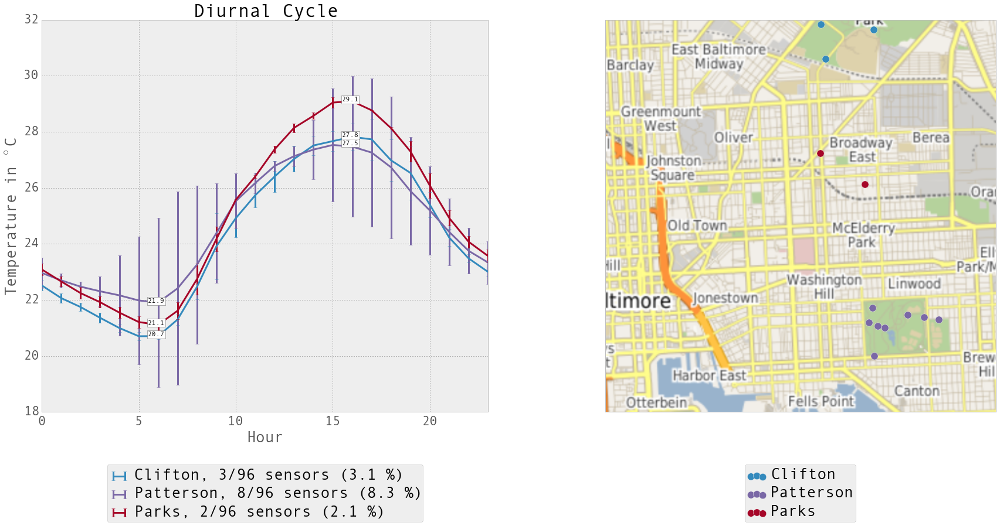

In [42]:
diurnalDF =  tempDF
diurnalDF["hour"] = tempDF.index.hour
diurnalDF.set_index("hour")

pattsensors = [9,11, 52, 30, 40, 119, 65, 14] # offset: 40, missing: 6
cliftonsensors = [74, 37, 115] # missing 39, 83
greensensors = meta['sensornumber'].values[np.where(meta['landcoverclass']=='grass')]
#pocketparks = np.setdiff1d(np.setdiff1d(greensensors, pattsensors), cliftonsensors) # find all the sensors in 'green' space not in big parks
# note that sensor 125, Bocek park, isn't a pocket park
pocketparks = [12,  73]

parks = {'Patterson': np.array(pattsensors), 
         'Clifton': np.array(cliftonsensors), 
         'Parks': np.array(pocketparks), 
         'Impervious': meta['sensornumber'].values[np.where(meta['landcoverclass']=='impervious')].astype(int) # sensor numbers which were in impervious

}

diurnalplotsgeneral(diurnalDF, parks)

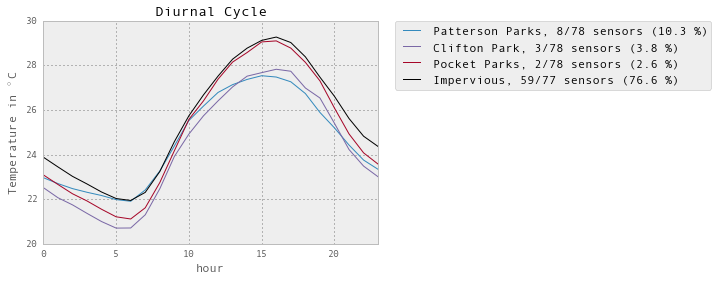

In [109]:
diurnalDF =  tempDF
diurnalDF["hour"] = tempDF.index.hour
diurnalDF.set_index("hour")

fig  = plt.figure(figsize=(30, 12))
plt.subplot(1,2,2)
        
m = Basemap(llcrnrlon=meta['location:Longitude'].min()-.005,
            llcrnrlat=meta['location:Latitude'].min()-.0005,
            urcrnrlon=meta['location:Longitude'].max()+.005,
            urcrnrlat=meta['location:Latitude'].max()+.0005,
            projection='mill',
            #projection = 'merc',
            resolution ='h',
            #area_thresh=1000.
            epsg=3857
            )
wms_server = "http://osm.woc.noaa.gov/mapcache" 
m.wmsimage(wms_server, layers = ["osm"], verbose = False)

pattsensors = [9,11, 52, 30, 40, 119, 65, 14] # offset: 40, missing: 6
cliftonsensors = [74, 37, 115] # missing 39, 83
greensensors = meta['sensornumber'].values[np.where(meta['landcoverclass']=='grass')]
#pocketparks = np.setdiff1d(np.setdiff1d(greensensors, pattsensors), cliftonsensors) # find all the sensors in 'green' space not in big parks
# note that sensor 125, Bocek park, isn't a pocket park
pocketparks = [12,  73]

plt.subplot(1,2,1)
lab = 'Patterson Parks, %s/%s sensors (%2.1f %%)'%(len(pattsensors), tempDF.shape[1], len(pattsensors)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[pattsensors].mean().mean(axis=1).plot(label = lab)
plt.hold(True)

lab = 'Clifton Park, %s/%s sensors (%2.1f %%)'%(len(cliftonsensors), tempDF.shape[1], len(cliftonsensors)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[cliftonsensors].mean().mean(axis=1).plot(label = lab)

lab = 'Pocket Parks, %s/%s sensors (%2.1f %%)'%(len(pocketparks), tempDF.shape[1], len(pocketparks)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[pocketparks].mean().mean(axis=1).plot(label = lab)

#plot impervious average
sunindices = meta['sensornumber'].values[np.where(meta['landcoverclass']=='impervious')].astype(int) # sensor numbers which were in impervious
lab = 'Impervious, %s/%s sensors (%2.1f %%)'%(np.where(meta['landcoverclass']=='impervious')[0].size, meta.sensornumber.shape[0],np.where(meta['landcoverclass']=='impervious')[0].size/float(meta.sensornumber.shape[0])*100 )
diurnalDF.set_index("hour").groupby(level=0).mean()[sunindices].mean(axis=1).plot(label = lab, color = 'black')

plt.title('Diurnal Cycle')
plt.ylabel('Temperature in $^\circ $C')
lgd = plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)#, ncol = 3)


plt.subplot(1,2,2)
#print 'now plotting map for %s'%option
x = meta['location:Longitude'][index].values
y = meta['location:Latitude'][index].values
marker_size = 150
for j in index:
    m.scatter(meta['location:Longitude'][j], meta['location:Latitude'][j], 
    s = marker_size, 
    c = pd.tools.plotting._get_standard_colors(3)[i], 
    label = option if j == index[0] else "", 
    latlon = True)

filename = './plots/diurnalParks.eps'
plt.savefig(filename, format = 'eps', dpi = 600, 
                    bbox_extra_artists=(lgd,), bbox_inches='tight')



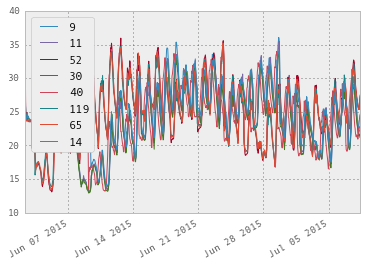

In [114]:
tempDF[pattsensors].plot()

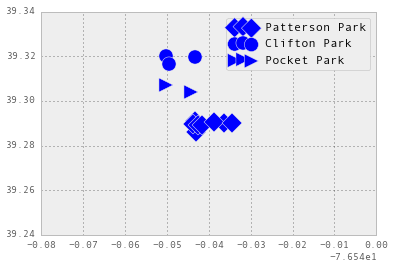

In [113]:
# Plot by attachment
fig  = plt.figure(figsize=(6,4))
scatter_handle = plt.scatter(meta['location:Longitude'][pattsensors], meta['location:Latitude'][pattsensors], s= 200,
            #c = tempDF[pattsensors].mean(),cmap = matplotlib.cm.RdBu_r, 
            marker = 'D', label = 'Patterson Park')
plt.hold(True)

plt.scatter(meta['location:Longitude'][cliftonsensors], meta['location:Latitude'][cliftonsensors], s= 200,
            #c = tempDF[cliftonsensors].mean(), cmap = matplotlib.cm.RdBu_r, 
            marker ='o',label = 'Clifton Park')

plt.scatter(meta['location:Longitude'][pocketparks], meta['location:Latitude'][pocketparks], s= 200,
            #c = tempDF[pocketparks].mean(),cmap = matplotlib.cm.RdBu_r,
            marker ='>',label = 'Pocket Park')

#colorbar_handle1 = plt.colorbar(scatter_handle)
#colorbar_handle1.set_label('Temperature in $^\circ $C')

plt.legend()

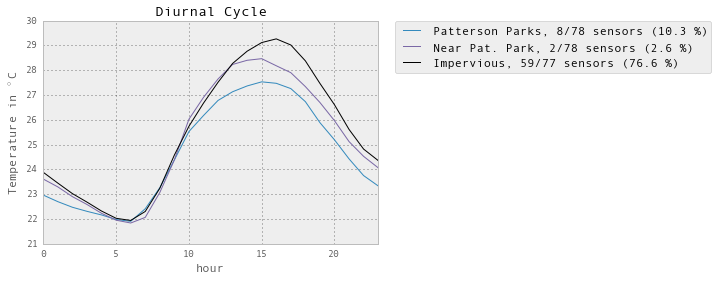

In [117]:
nearpatt = [27, 19] #, 32, 85] # 103

lab = 'Patterson Parks, %s/%s sensors (%2.1f %%)'%(len(pattsensors), tempDF.shape[1], len(pattsensors)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[pattsensors].mean().mean(axis=1).plot(label = lab)
plt.hold(True)

lab = 'Near Pat. Park, %s/%s sensors (%2.1f %%)'%(len(nearpatt), tempDF.shape[1], len(nearpatt)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[nearpatt].mean().mean(axis=1).plot(label = lab)

#plot impervious average
sunindices = meta['sensornumber'].values[np.where(meta['landcoverclass']=='impervious')].astype(int) # sensor numbers which were in impervious
lab = 'Impervious, %s/%s sensors (%2.1f %%)'%(np.where(meta['landcoverclass']=='impervious')[0].size, meta.sensornumber.shape[0],np.where(meta['landcoverclass']=='impervious')[0].size/float(meta.sensornumber.shape[0])*100 )
diurnalDF.set_index("hour").groupby(level=0).mean()[sunindices].mean(axis=1).plot(label = lab, color = 'black')

plt.title('Diurnal Cycle')
plt.ylabel('Temperature in $^\circ $C')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)#, ncol = 3)

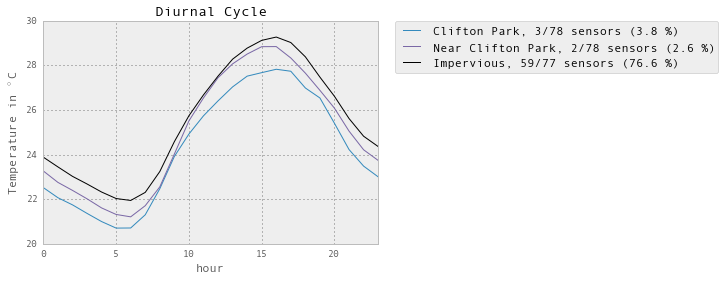

In [121]:
nearpatt = [89,21] #, 32, 85] # 103

lab = 'Clifton Park, %s/%s sensors (%2.1f %%)'%(len(cliftonsensors), tempDF.shape[1], len(cliftonsensors)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[cliftonsensors].mean().mean(axis=1).plot(label = lab)

plt.hold(True)

lab = 'Near Clifton Park, %s/%s sensors (%2.1f %%)'%(len(nearpatt), tempDF.shape[1], len(nearpatt)/float(tempDF.shape[1])*100)
diurnalDF.set_index("hour").groupby(level=0)[nearpatt].mean().mean(axis=1).plot(label = lab)

#plot impervious average
sunindices = meta['sensornumber'].values[np.where(meta['landcoverclass']=='impervious')].astype(int) # sensor numbers which were in impervious
lab = 'Impervious, %s/%s sensors (%2.1f %%)'%(np.where(meta['landcoverclass']=='impervious')[0].size, meta.sensornumber.shape[0],np.where(meta['landcoverclass']=='impervious')[0].size/float(meta.sensornumber.shape[0])*100 )
diurnalDF.set_index("hour").groupby(level=0).mean()[sunindices].mean(axis=1).plot(label = lab, color = 'black')

plt.title('Diurnal Cycle')
plt.ylabel('Temperature in $^\circ $C')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)#, ncol = 3)

In [86]:
files = glob.glob('./data/observations/urban/*.csv')
files.sort()
#urbanDF = pd.DataFrame(pd.read_csv(files[0], sep = ','))
frames = []
date_spec = {'Date': [2, 3, 4]}
#pd.read_csv(file, sep = ',') #, parse_dates = date_spec, keep_date_col=True)
for file in files:
    try :
        frames.append(pd.read_csv(file, sep = ',', parse_dates = date_spec, keep_date_col=True, index_col='Date'))
    except ValueError:
        print "oops... something went wrong"
urbanDF = pd.concat(frames, axis =0)

files = glob.glob('./data/observations/rural/*.csv')
files.sort()
#urbanDF = pd.DataFrame(pd.read_csv(files[0], sep = ','))
frames = []
date_spec = {'Date': [2, 3, 4]}
#pd.read_csv(file, sep = ',') #, parse_dates = date_spec, keep_date_col=True)
for file in files:
    try :
        frames.append(pd.read_csv(file, sep = ',', parse_dates = date_spec, keep_date_col=True, index_col='Date'))
    except ValueError:
        print "oops... something went wrong"
ruralDF = pd.concat(frames, axis =0)

ind  = urbanDF.index.intersection(ruralDF.index)
urbanDF = urbanDF.ix[ind]
ruralDF = ruralDF.ix[ind]

ruralDF = ruralDF[ruralDF < 1000]
urbanDF = urbanDF[urbanDF < 1000]


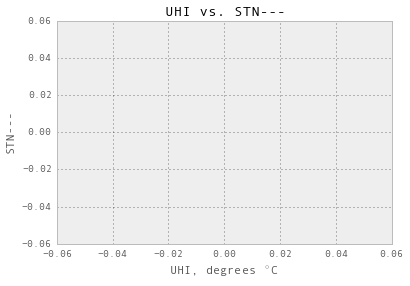

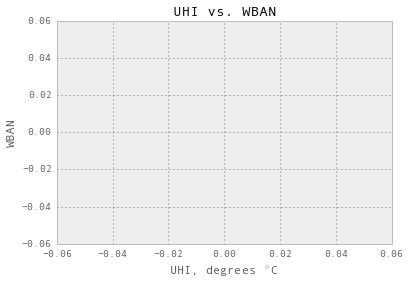

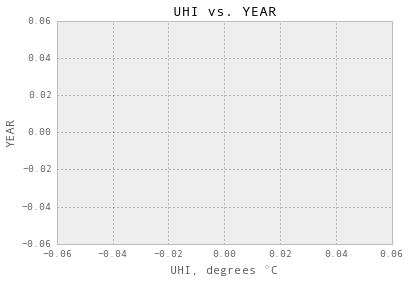

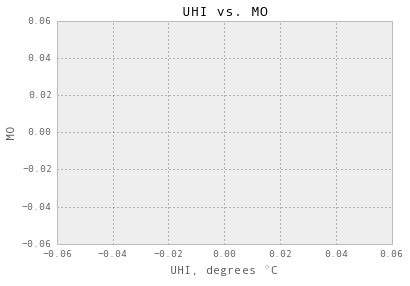

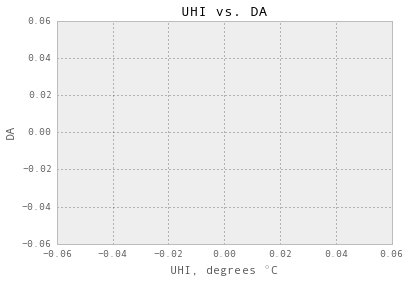

...

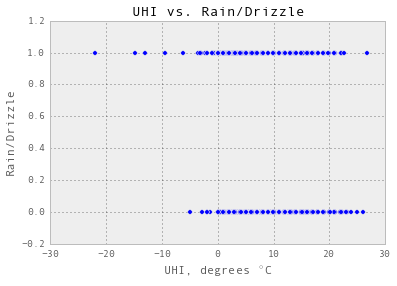

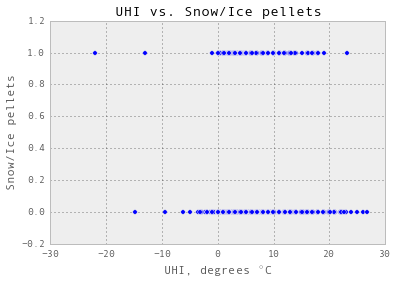

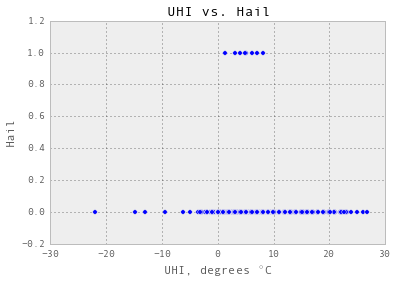

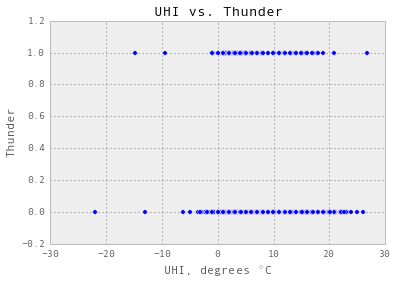

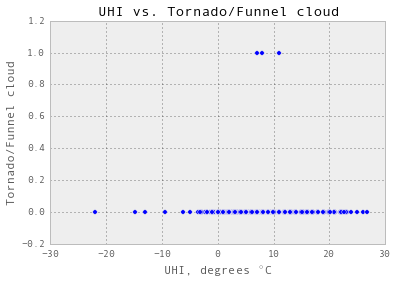

In [87]:
UHI = urbanDF.MIN - ruralDF.MIN
#UHI = ruralDF.MIN
for variable in ruralDF: 
    try: 
        plt.scatter(UHI, ruralDF[variable])        
        plt.xlabel('UHI, degrees $^\circ$C')
        plt.ylabel(variable)
        plt.title('UHI vs. %s'%variable)
        plt.show()
    except ValueError: 
        print 'skipping %s'%variable

In [123]:
# Analyze heatwaves and UHI 
minthresh = (np.load('BWImindailytempthresholds.npy') -32) *5/9.
for year in range(1999,2015): 
    if year in (2000,2004,2008, 2012,): 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'min') - minthresh[1]>0)
    else: 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'min')- minthresh[1][1:]>0)
        
    a = np.where(HWindex[0][1:]- HWindex[0][:-1]==1)[0] #Find where heatwave duration is more than one day (ie, two days)
    lastingHW = HWindex[0][a]
    print year, lastingHW

1999 [248 270 325 326 327 328]
2000 [ 69 126 127 128 168 243 313]
2001 [ 44  45 111 164 165 219 220 221 331 332 333 346]
2002 [ 28 104 105 106 226 234 283]
2003 [ 75 308]
2004 [ 62  63  64 131 132 133 143 271]
2005 [257 258 267]
2006 [ 33 212 213 237 238 239 290 333]
2007 [  4   5  12  13  81 279 280 295]
2008 [288 361]
2009 [ 41  65 232 300]
2010 [ 95 121 122 153 154 178 221 266 298]
2011 [ 76 115 150 202 203 267 268 284 318]
2012 [ 25  72  73  77  78  79  80  81  82  83 216 246 247 299 300 350 351]
2013 [ 98  99 253 353 354]
2014 [242 286]


/Users/annascott2/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


IndexError: index 5 is out of bounds for axis 0 with size 0

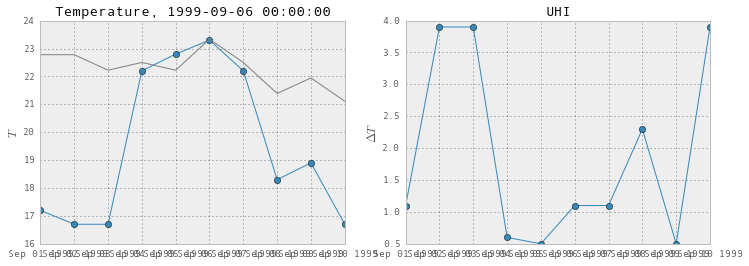

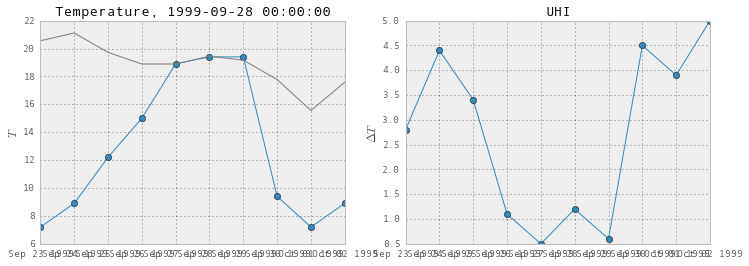

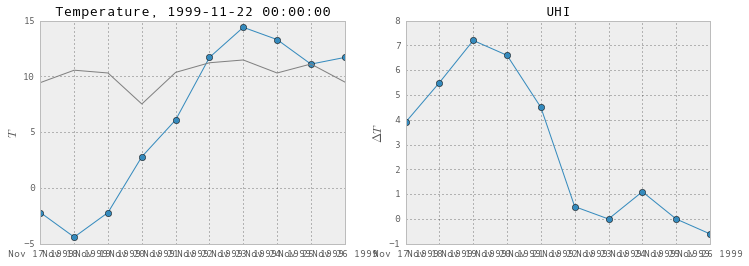

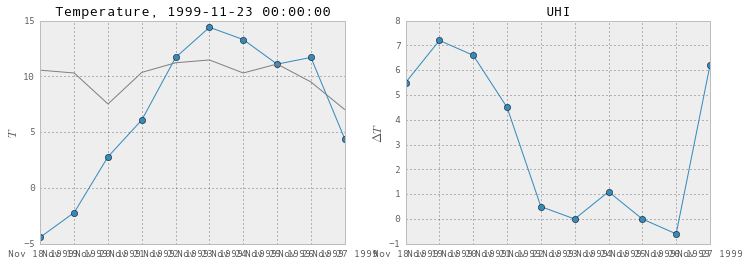

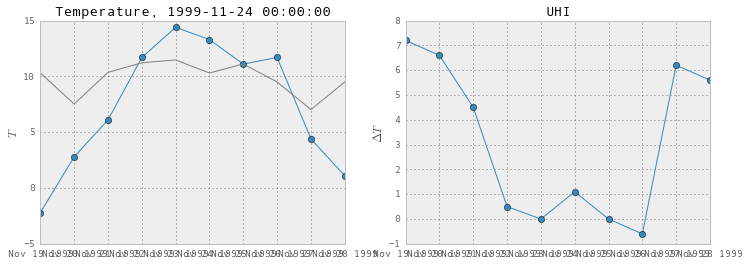

...

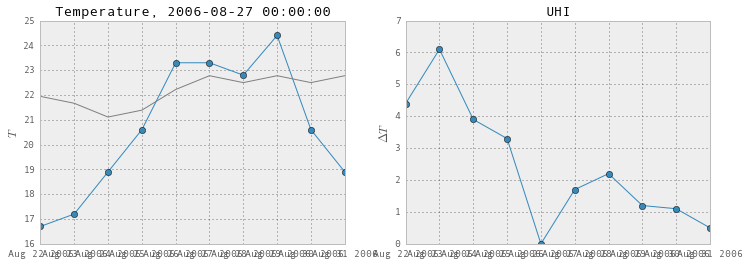

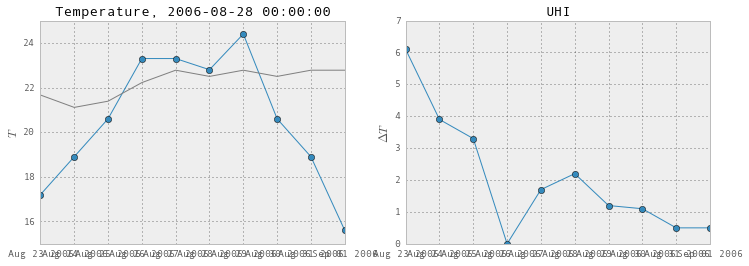

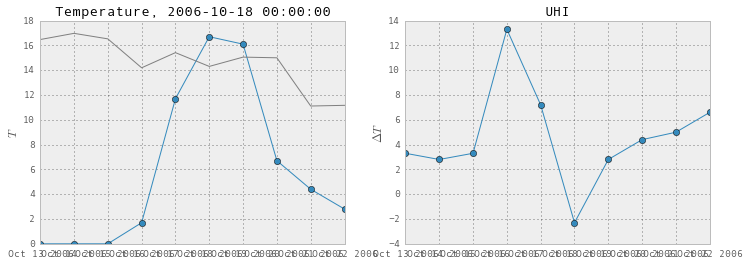

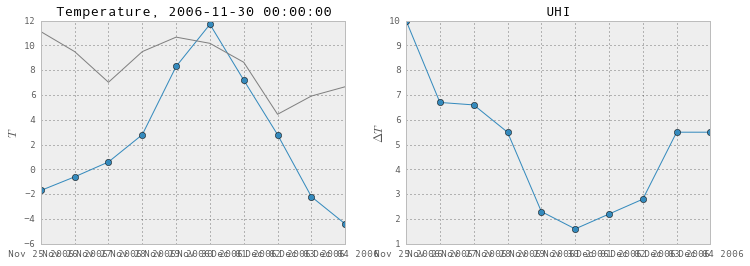

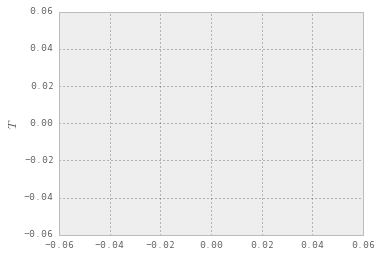

In [122]:
# Analyze heatwaves and UHI 
minthresh = (np.load('BWImindailytempthresholds.npy') -32) *5/9.
for year in range(1999,2015): 
    if year in (2000,2004,2008, 2012,): 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'min') - minthresh[1]>0)
    else: 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'min')- minthresh[1][1:]>0)
        
    a = np.where(HWindex[0][1:]- HWindex[0][:-1]==1)[0] #Find where heatwave duration is more than one day (ie, two days)
    lastingHW = HWindex[0][a]
#    print year, lastingHW
    for i in lastingHW: 
        temp = observations.rural[observations.index.year == year].resample('D', how = 'min')[i-5:i+5]
        UHI  = observations.urban[observations.index.year == year].resample('D', how = 'min')[i-5:i+5] - temp
        plt.figure(figsize=[12,4])
        plt.subplot(1,2,1)
        plt.plot(temp.index,temp, '-o')
        plt.plot(temp.index, minthresh[1][i-5:i+5], color = 'grey')
        plt.ylabel('$ T$')
        plt.title('Temperature, %s'%temp.index[5])

        plt.subplot(1,2,2)
        plt.plot(temp.index,UHI, '-o')
        plt.ylabel('$\Delta T$')
        plt.title('UHI')

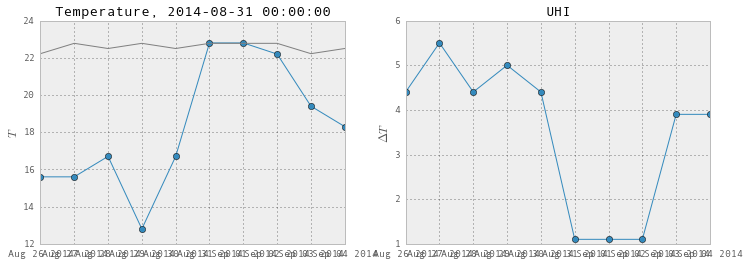

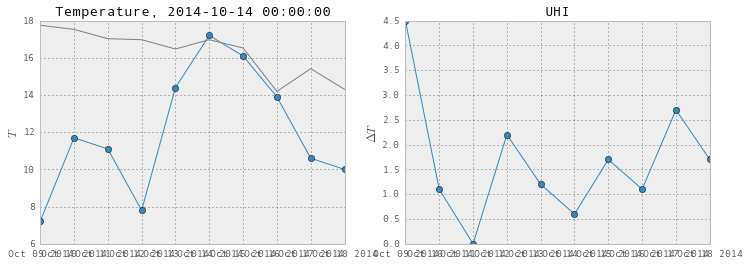

In [126]:
for i in lastingHW: 
    temp = observations.rural[observations.index.year == year].resample('D', how = 'min')[i-5:i+5]
    UHI  = observations.urban[observations.index.year == year].resample('D', how = 'min')[i-5:i+5] - temp
    plt.figure(figsize=[12,4])
    plt.subplot(1,2,1)
    plt.plot(temp.index,temp, '-o')
    plt.plot(temp.index, minthresh[1][i-5:i+5], color = 'grey')
    plt.ylabel('$ T$')
    plt.title('Temperature, %s'%temp.index[5])
    
    plt.subplot(1,2,2)
    plt.plot(temp.index,UHI, '-o')
    plt.ylabel('$\Delta T$')
    plt.title('UHI')

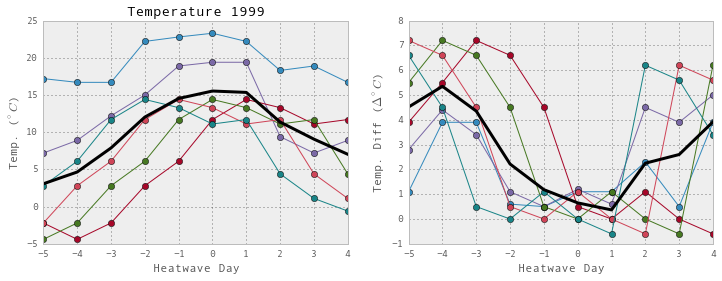

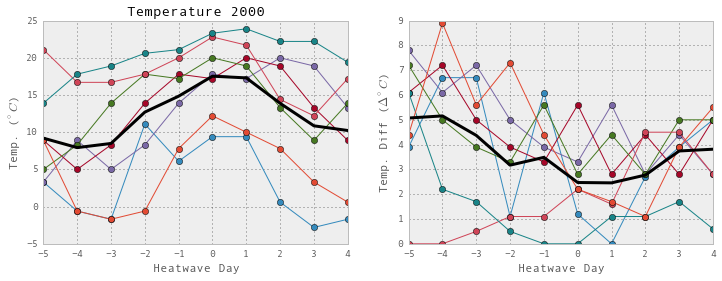

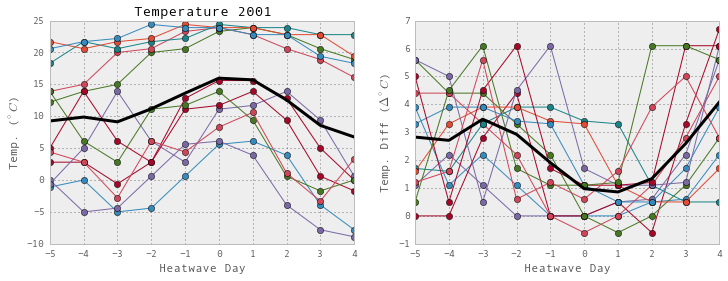

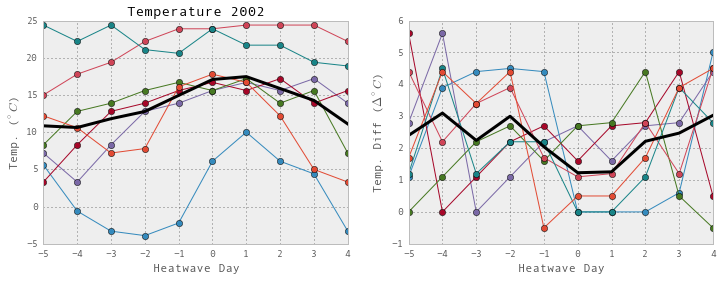

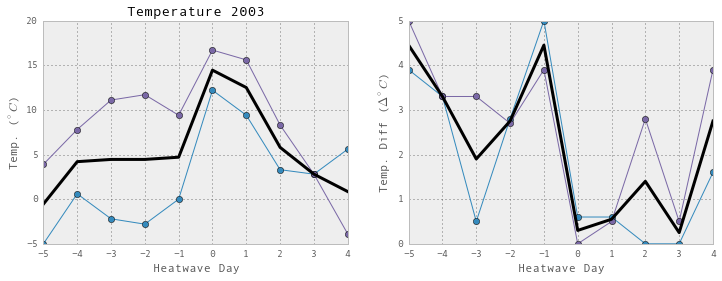

...

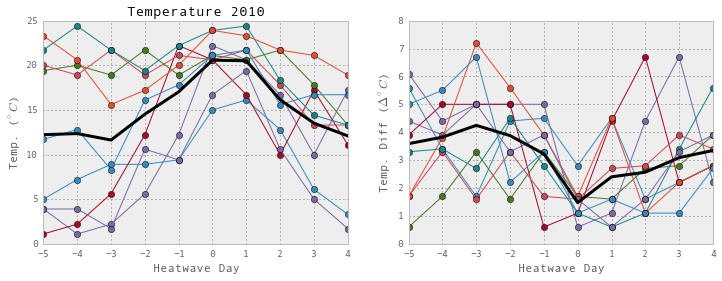

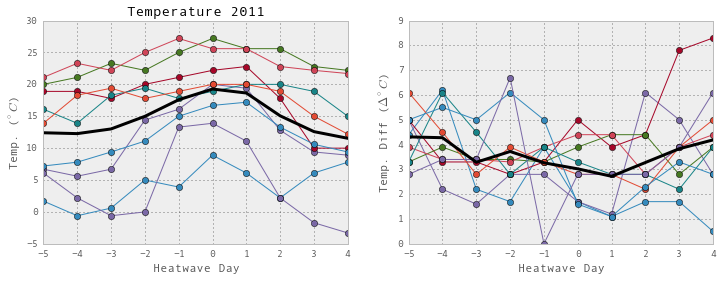

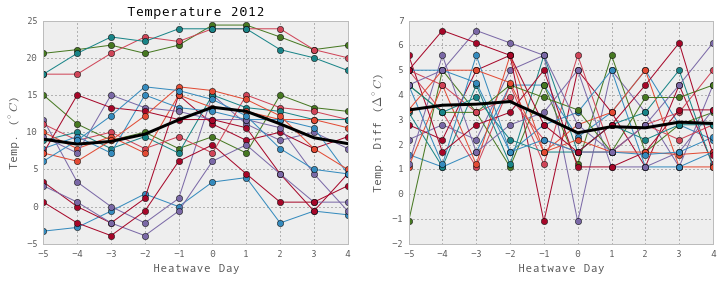

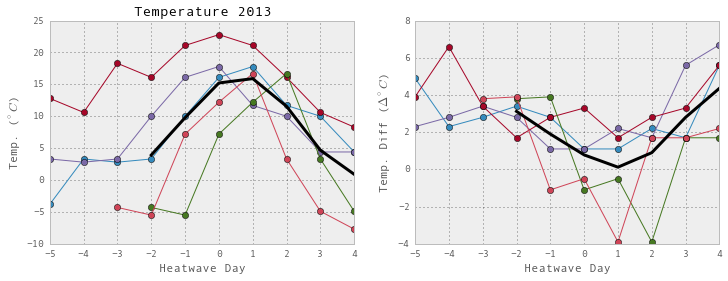

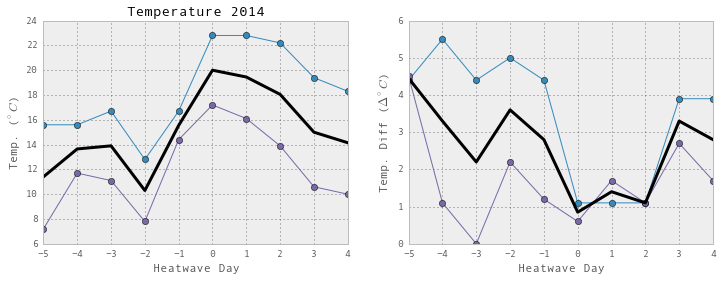

In [188]:
# Analyze heatwaves and UHI 
minthresh = (np.load('BWImindailytempthresholds.npy') -32) *5/9.
for year in range(1999, 2015): #range(1999,2015): 
    if year in (2000,2004,2008, 2012,): 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'min') - minthresh[1]>0)
    else: 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'min')- minthresh[1][1:]>0)
        
    a = np.where(HWindex[0][1:]- HWindex[0][:-1]==1)[0] #Find where heatwave duration is more than one day (ie, two days)
    lastingHW = HWindex[0][a]
#    print year, lastingHW
## Make a composite
    compositeTemp = np.zeros([10, lastingHW.shape[0]])
    compositeUHI = np.zeros([10, lastingHW.shape[0]])
    ind = 0
    for i in lastingHW: 
        temp = observations.rural[observations.index.year == year].resample('D', how = 'min')[i-5:i+5]
        UHI  = observations.urban[observations.index.year == year].resample('D', how = 'min')[i-5:i+5] - temp
        if temp.shape[0] > 0 : 
            compositeTemp[:,ind] = temp
            compositeUHI[:,ind] = UHI
        ind = ind +1
     
    plt.figure(figsize=[12,4])
    plt.subplot(1,2,1)
    tHandle   = plt.plot(np.arange(-5,5,1),compositeTemp, '-o')
    plt.plot(np.arange(-5,5,1),compositeTemp.mean(axis=1), linewidth = 3, color = 'black')
    #plt.plot(temp.index, minthresh[1][i-5:i+5], color = 'grey')
    plt.title('Temperature %s'%year)
    plt.ylabel('Temp. ($^\circ C$)')
    plt.xlabel('Heatwave Day')

    plt.subplot(1,2,2)    
    uhiHandle = plt.plot(np.arange(-5,5,1),compositeUHI, '-o')
    plt.plot(np.arange(-5,5,1),compositeUHI.mean(axis=1), linewidth = 3,color = 'black')
    plt.ylabel('Temp. Diff ($\Delta ^\circ C$)')
    plt.xlabel('Heatwave Day')

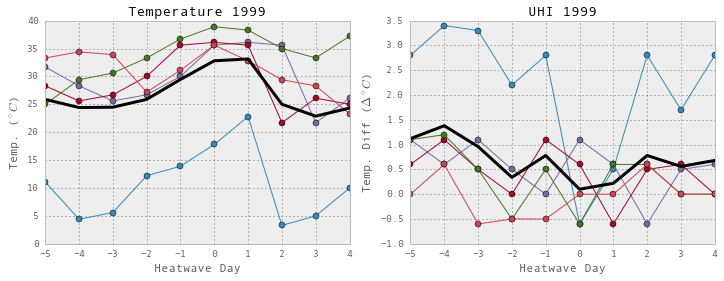

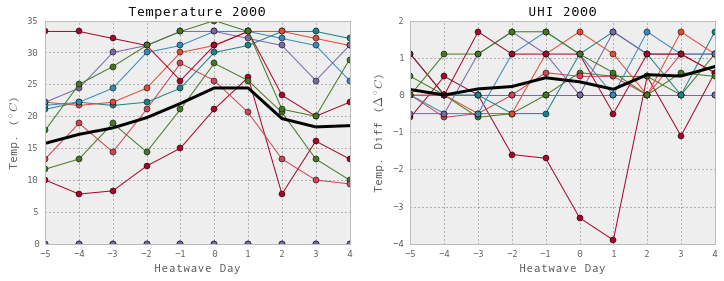

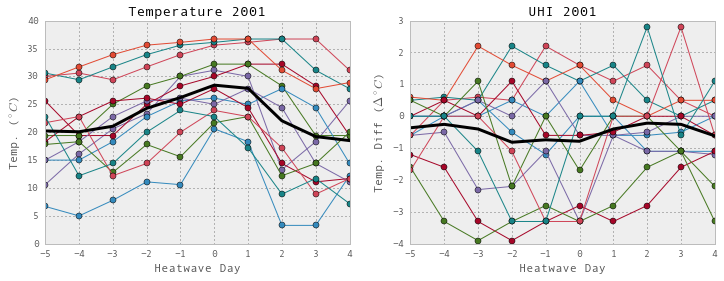

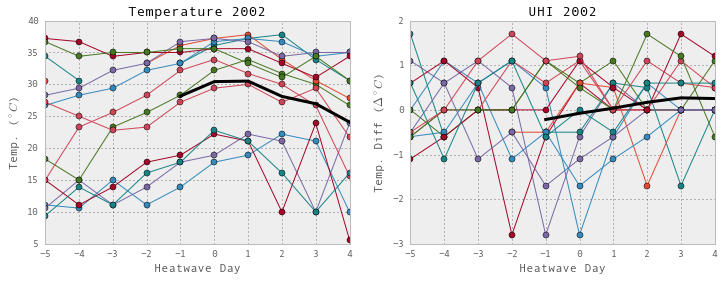

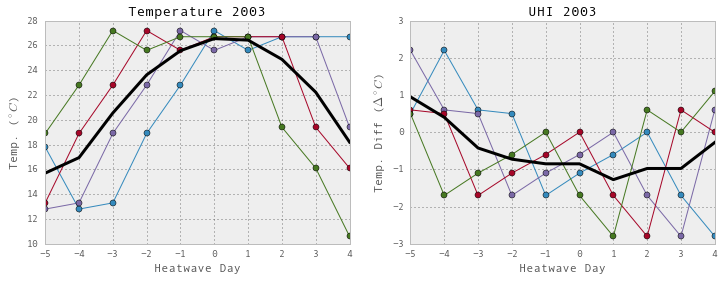

...

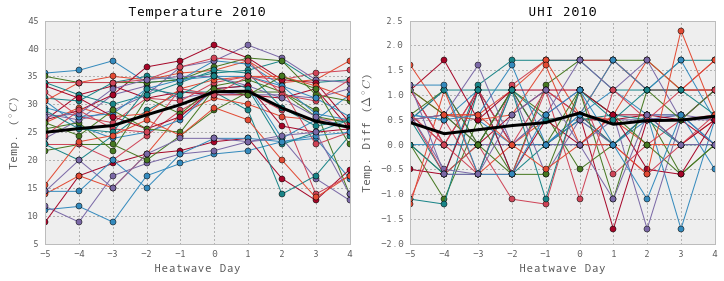

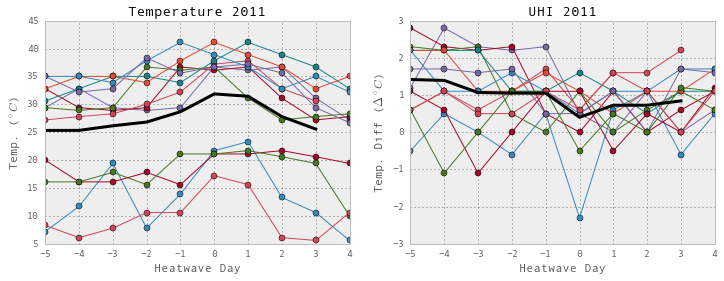

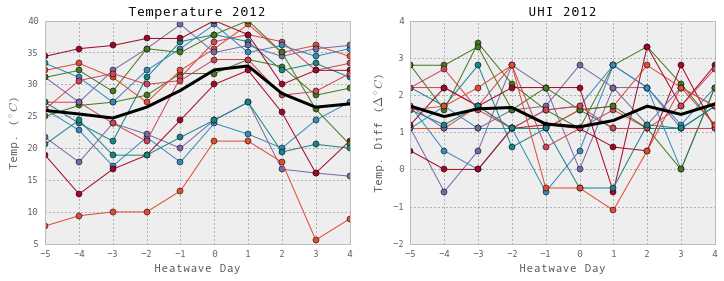

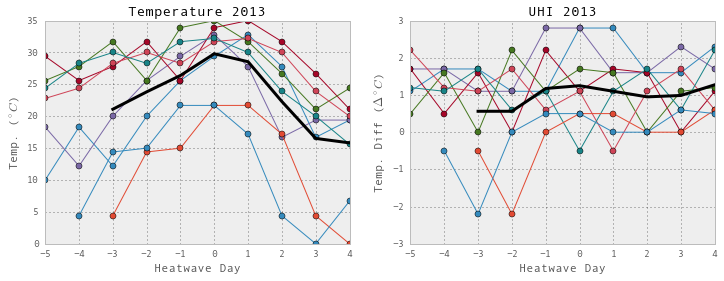

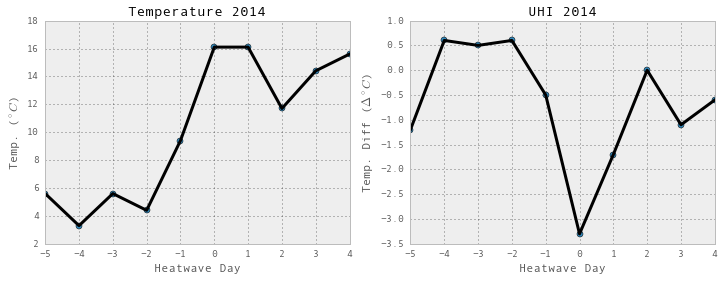

In [6]:
# Analyze heatwaves and UHI 
maxthresh = (np.load('BWImaxdailytempthresholds.npy') -32) *5/9.
for year in range(1999, 2015): #range(1999,2015): 
    if year in (2000,2004,2008, 2012,): 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'max') - maxthresh[1]>0)
    else: 
        HWindex = np.where( observations.rural[observations.index.year == year].resample('D', how = 'max')- maxthresh[1][1:]>0)
        
    a = np.where(HWindex[0][1:]- HWindex[0][:-1]==1)[0] #Find where heatwave duration is more than one day (ie, two days)
    lastingHW = HWindex[0][a]
#    print year, lastingHW
## Make a composite
    compositeTemp = np.zeros([10, lastingHW.shape[0]])
    compositeUHI = np.zeros([10, lastingHW.shape[0]])
    ind = 0
    for i in lastingHW: 
        temp = observations.rural[observations.index.year == year].resample('D', how = 'max')[i-5:i+5]
        UHI  = observations.urban[observations.index.year == year].resample('D', how = 'max')[i-5:i+5] - temp
        if temp.shape[0] > 0 : 
            compositeTemp[:,ind] = temp
            compositeUHI[:,ind] = UHI
        ind = ind +1
     
    plt.figure(figsize=[12,4])
    plt.subplot(1,2,1)
    tHandle   = plt.plot(np.arange(-5,5,1),compositeTemp, '-o')
    plt.plot(np.arange(-5,5,1),compositeTemp.mean(axis=1), linewidth = 3, color = 'black')
    #plt.plot(temp.index, minthresh[1][i-5:i+5], color = 'grey')
    plt.title('Temperature %s'%year)
    plt.ylabel('Temp. ($^\circ C$)')
    plt.xlabel('Heatwave Day')

    plt.subplot(1,2,2)    
    uhiHandle = plt.plot(np.arange(-5,5,1),compositeUHI, '-o')
    plt.plot(np.arange(-5,5,1),compositeUHI.mean(axis=1), linewidth = 3,color = 'black')
    plt.ylabel('Temp. Diff ($\Delta ^\circ C$)')
    plt.xlabel('Heatwave Day')
    plt.title('UHI %s'%year)

In [28]:
# Find the hottest 20 temperatures 
np.sort(observations.urban.values)[-20:]

array([ 38.3,  38.3,  38.9,  38.9,  38.9,  38.9,  39.4,  39.4,  39.4,
        39.4,  39.4,  39.4,  39.4,  40. ,  40.6,  41.1,  41.1,  41.7,
        42.2,  42.2])

In [29]:
np.argmax(observations.urban.values, )

12347